# Analysis of Rigid Registration

In [1]:
%load_ext autoreload
%autoreload 1

In [7]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import pandas as pd
import pyvista as pv

from coma.datasets.ukbb_meshdata import UKBBMeshDataset
from coma.utils import transforms
from coma.utils.visualise import plot_single_mesh, plot_mesh

In [5]:
%aimport coma.utils.decomposition
%aimport coma.utils.visualise

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Load Dataset

In [8]:
brain_substructure = 'BrStem'

In [9]:
# Preprocessor
preprocessor = transforms.get_transforms()

# Load Dataset
mesh_path = "/vol/biomedic3/bglocker/brainshapes"
cache_path = "/vol/bitbucket/rrr2417/deepscm_data_cache"
csv_path = "/vol/biomedic3/bglocker/brainshapes/ukb21079_extracted.csv"
split = 0.8

substructure_to_udi = {
    'BrStem': '25025-2.0', 
    'L_Thal': '25011-2.0',
    'L_Caud': '25013-2.0',
    'L_Puta': '25015-2.0',
    'L_Pall': '25017-2.0',
    'L_Hipp': '25019-2.0',
    'L_Amyg': '25021-2.0',
    'L_Accu': '25023-2.0',
    'R_Thal': '25012-2.0',
    'R_Caud': '25014-2.0',
    'R_Puta': '25016-2.0',
    'R_Pall': '25018-2.0',
    'R_Hipp': '25020-2.0',
    'R_Amyg': '25022-2.0',
    'R_Accu': '25024-2.0',
}

feature_name_map = {
    '31-0.0': 'sex',
    '21003-0.0': 'age',
    substructure_to_udi[brain_substructure]: 'structure_volume',  # Brain Stem
    '25010-2.0': 'brain_volume',  # Unnormalised brain volume from UKBB
}

metadata_df = pd.read_csv(csv_path)

total_train_dataset = UKBBMeshDataset(
    mesh_path,
    substructures=[brain_substructure],
    split=split,
    train=True,
    transform=preprocessor,
    reload_path=True,
    features_df=metadata_df,
    feature_name_map=feature_name_map,
    cache_path=cache_path,
)

/vol/bitbucket/rrr2417/deepscm/ENV2/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3155: DtypeWarning: Columns (255,273,274,275,279,351,451,452,453,454,1344,1347,1350,1351,1352,1396,1397,1398,1399,1400,1401,1402,1428,1429,1430,1431,1432,1433,1434,1492,1596,1597,1598,1599,1600,1601,1602,1603,1604,1605,1606,1607,1608,1609,1610,1611,1612,1613,1614,1615,1616,1968,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030,2031,2032,2033,2034,2035,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047,2048,2049,2050,2051,2052,2053,2054,2055,2056,2057,2058,2059,2060,2061,2062,2063,2064,2065,2066,2431) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [10]:
len(total_train_dataset)

11601

In [11]:
template_path = '/vol/biomedic3/bglocker/brainshapes/5026976/T1_first-BrStem_first.vtk'
template = pv.read(template_path)
faces = template.faces.T.reshape(-1, 4)[:, 1:]

In [13]:
meshes = torch.cat([total_train_dataset[i][0] for i in range(len(total_train_dataset))], 0).detach().numpy()
print(meshes.shape)
features = pd.concat([total_train_dataset[i][1] for i in range(len(total_train_dataset))], 0)
print(features.shape)
features.head()

(11601, 642, 3)
(11601, 5)


,eid,sex,age,structure_volume,brain_volume
4367,1000596,1,54,30672,1331850
10908,1000811,1,46,24685,1255420
829,1000845,1,54,24183,1155230
4846,1001078,1,62,24390,1200210
2299,1001494,1,49,22527,1329680


In [202]:
# Get validation subset from meshes using the same random key

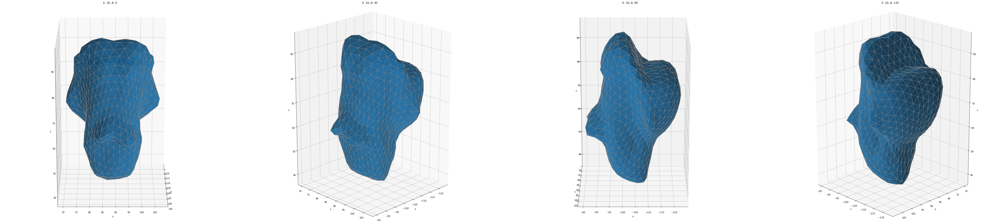

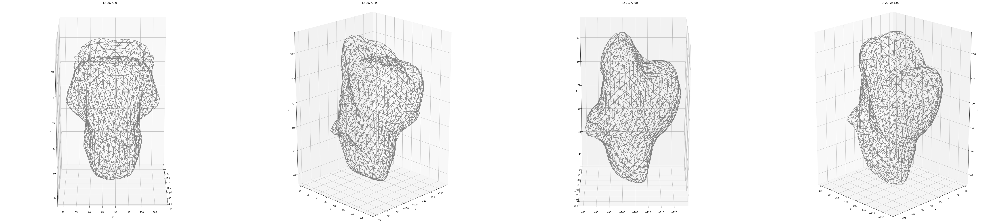

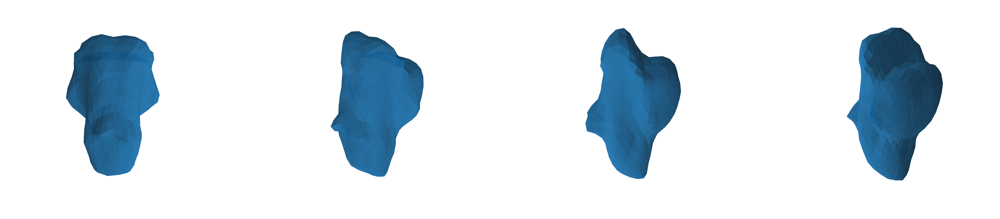

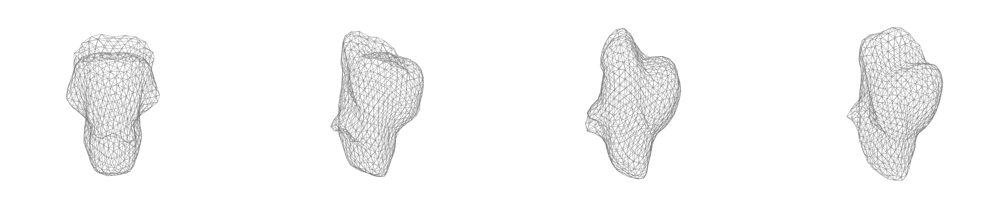

In [659]:
from scipy.spatial.transform import Rotation as R

axis_scaling = [1, 1, 1.5]

rot_transform = R.from_rotvec([0, 0, np.pi * 0.5])
mean_mesh = meshes.mean(axis=0)
mean_mesh = rot_transform.apply(mean_mesh)

plot_mesh(
    mean_mesh,
    faces,
    figsize=(80, 20),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
)

plot_mesh(
    mean_mesh,
    faces,
    figsize=(80, 20),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    alpha=0,
)

plot_mesh(
    mean_mesh,
    faces,
    figsize=(80, 50),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    hide_grid=True,
    antialias=True,
)

plot_mesh(
    mean_mesh,
    faces,
    figsize=(80, 50),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    hide_grid=True,
    alpha=0,
)

## Visualising Singular Values

This is misleading

[-0.58081519  0.34333078 -0.73809057] [62.38591968  0.          0.        ]
[-0.68105154  0.29170796  0.67162137] [ 0.         18.99872659  0.        ]

[-0.58079028  0.37255232 -0.72380067] [62.37512689  0.          0.        ]
[-0.68138433  0.26401803  0.68264916] [ 0.         18.20091006  0.        ]

[-0.58093654  0.32509263 -0.74620876] [62.36952735  0.          0.        ]
[-0.68118968  0.30762746  0.66433875] [ 0.         18.71163367  0.        ]

[-0.58095592  0.34441346 -0.73747514] [62.3746422  0.         0.       ]
[-0.68117455  0.29021888  0.67214153] [ 0.         18.52344072  0.        ]

[-0.58096573  0.32938576 -0.74430091] [62.36738506  0.          0.        ]
[-0.68107868  0.30396572  0.66613563] [ 0.        18.6312059  0.       ]

[-0.58120083  0.33044138  0.74364917] [62.37136  0.       0.     ]
[-0.68126756  0.30221818 -0.66673734] [ 0.         18.04533164  0.        ]

[-0.58083987  0.28722224 -0.76166163] [62.37677614  0.          0.        ]
[-0.68106988  0.34099

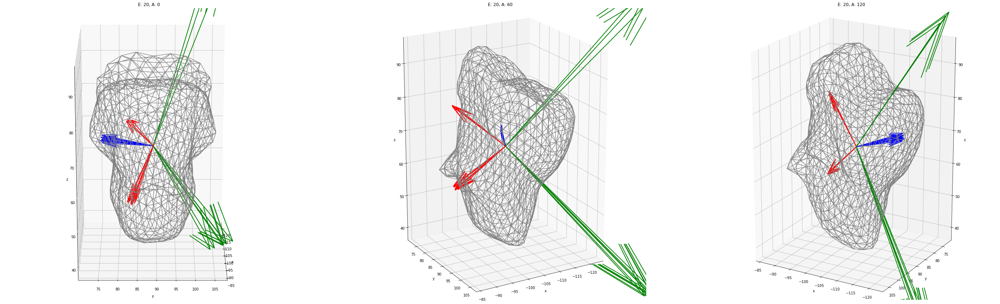

In [419]:
from scipy.spatial.transform import Rotation as R

max_azimuth = 180
azimuths = 3
axes = plot_mesh(
    mean_mesh,
    faces,
    figsize=(50, 20),
    elevations=[20],
    azimuths=azmiuths,
    max_azimuth=max_azimuth,
    axis_scaling=axis_scaling,
    alpha=0,
    show=False,
)

r = R.from_rotvec([0, 0, np.pi * 0.5])

center = meshes.mean(axis=0).mean(axis=0)
center = r.apply(center)

max_comp = 30

from matplotlib.colors import Normalize
cm = plt.cm.inferno
norm = Normalize()
norm.autoscale(colormap)

NP = np.random.random(3)

batch_size = 10

for i in range(batch_size):
    mesh = meshes[i]
    U, S, V_T = np.linalg.svd(mesh)
    # det = np.linalg.det(U) * np.linalg.det(V_T.T)
    S = np.diag(np.sqrt(S))
    if det < 0: # np.isclose(det, 1.):
        S *= -1
        # V_T = r.apply(V_T) * np.sqrt(S)
    # else:
    #     print('here')
    #     V_T = r.apply(V_T) * 40 # * np.sqrt(S)
    print(V_T[:, 0], S[0])
    print(V_T[:, 1], S[1])
    # print(S)
    print()
    V_T = r.apply(V_T @ S)  # * 30 #  @ np.diag(np.sqrt(S)
    for i in range(azimuths):
        for j, color in enumerate(['red', 'green', 'blue']):
            axes[0, i].quiver(*center, *V_T[:, j], lw=2, colors=color)

plt.show()

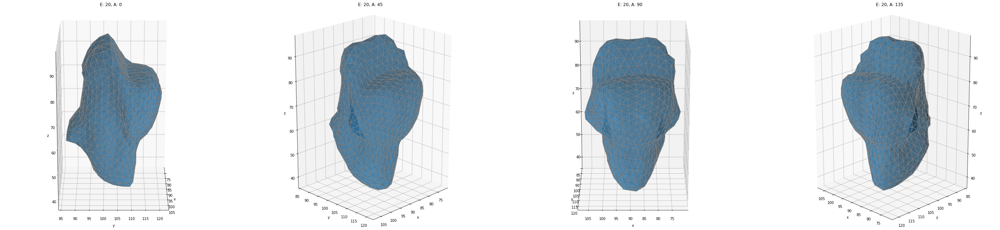

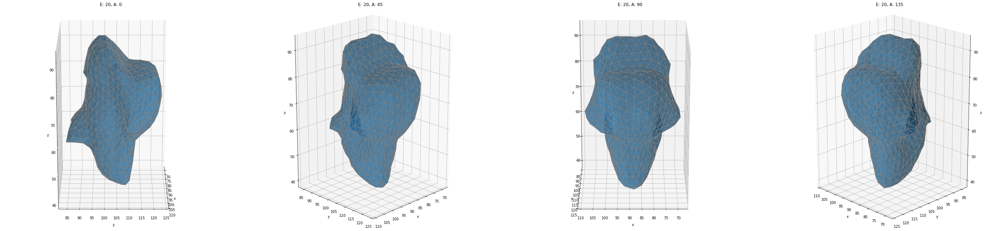

In [407]:
# Alignment 1
plot_mesh(
    meshes[4],
    faces,
    figsize=(50, 50),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    alpha=0.5,
)

# Alignment 2
plot_mesh(
    meshes[5],
    faces,
    figsize=(50, 50),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    alpha=0.5,
)

## Heatmap

#### Heatmap of RMSE from registration against arbitrary mesh

In [455]:
from coma.utils.registration import RigidRegistration

# r = R.from_rotvec([0, 0, np.pi * 0.5])

preprocessor_mean = transforms.get_transforms()
# mean_mesh = meshes.mean(axis=0)
# preprocessor_mean.transforms[2].reg_obj = RigidRegistration
# preprocessor_mean.transforms[2](mean_mesh)

# print(meshes.shape)

# plot_mesh(
#     r.apply(mean_mesh),
#     faces,
#     figsize=(50, 50),
#     elevations=[20],
#     azimuths=4,
#     max_azimuth=180,
#     axis_scaling=axis_scaling,
#     alpha=0.8,
# )

total_train_dataset_mean = UKBBMeshDataset(
    mesh_path,
    substructures=[brain_substructure],
    split=split,
    train=True,
    transform=preprocessor_mean,
    reload_path=True,
    features_df=metadata_df,
    feature_name_map=feature_name_map,
    cache_path=cache_path,
)

In [457]:
meshes_reg_mean = torch.cat([
    total_train_dataset_mean[i][0] for i in range(100)  # len(total_train_dataset_mean))
], 0).detach().numpy()

In [474]:
def calculate_normals(verts, faces):
    normals = np.zeros((faces.shape[0], 3))

    for i, vert_idxs in enumerate(faces):
        a, b, c = verts[vert_idxs]
        normal = np.cross(b - a, c - a)
        normal /= normal.sum()
        normals[i] = normal
    
    return normals

In [476]:
fixed_img = preprocessor_mean.transforms[2].reg.fixed_image
fixed_img_normals = calculate_normals(fixed_img, faces)

In [477]:
dataset_normals = np.zeros((100, faces.shape[0], 3))

for i, mesh in enumerate(meshes_reg_mean):
    dataset_normals[i] = calculate_normals(mesh, faces)

In [486]:
errs = (dataset_normals * fixed_img_normals).sum(axis=2).mean(axis=0)

In [565]:
errs.shape

(1280,)

In [509]:
errs.min(), errs.max(), errs.mean()

(0.3353389599245141, 161664979.3762225, 128809.30185131475)

In [517]:
import matplotlib
norm = matplotlib.colors.Normalize(vmin=errs.min(), vmax=errs.max())
plt.cm.rainbow(norm(errs))
col2 = plt.cm.Reds(np.linspace(0,1,1280))

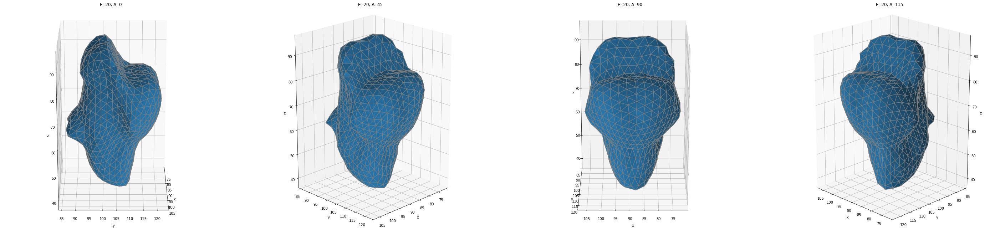

In [726]:
mean_mesh = meshes_reg_mean.mean(axis=0)
preprocessor_mean.transforms[2].reg_obj = RigidRegistration
preprocessor_mean.transforms[2](mean_mesh)

plot_mesh(
    mean_mesh,
    faces,
    figsize=(50, 50),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    alpha=0.8,
    antialias=False,
)

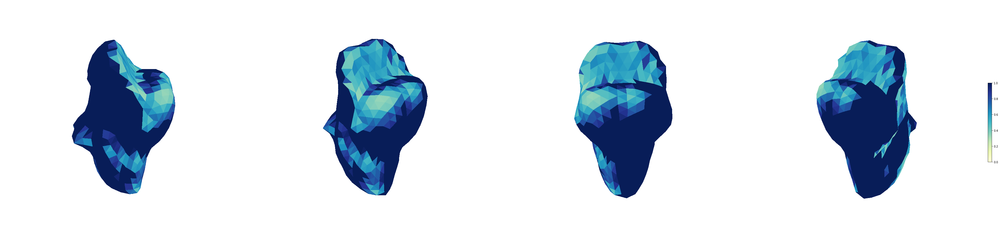

In [747]:
plot_mesh(
    mean_mesh,
    faces,
    figsize=(50, 20),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    alpha=1,
    edgecolor=None,
    facecolors=errs,
    hide_grid=True,
    ax_lims=[(70, 110), (85, 125), (35, 100)],
)

In [562]:
var = ((meshes_reg_mean - mean_mesh) ** 2).mean(axis=0).sum(axis=1) / 3
std = np.sqrt(var)

In [563]:
std.shape

(642,)

#### Heatmap of RMSE from registration against deformed mesh

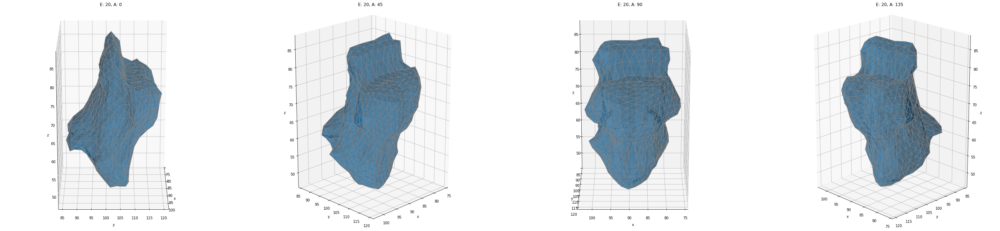

In [350]:
min_vol_mask = features.structure_volume == features.structure_volume.min()

plot_mesh(
    meshes[min_vol_mask.argmax()],
    faces,
    figsize=(50, 50),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    alpha=0.5,
)

In [353]:
from coma.utils.registration import RigidRegistration

preprocessor_deformed = transforms.get_transforms()
deformed_fixed_mesh = meshes[min_vol_mask.argmax()]
preprocessor_deformed.transforms[2].reg_obj = RigidRegistration
preprocessor_deformed.transforms[2](deformed_fixed_mesh)

total_train_dataset_deformed = UKBBMeshDataset(
    mesh_path,
    substructures=[brain_substructure],
    split=split,
    train=True,
    transform=preprocessor_deformed,
    reload_path=True,
    features_df=metadata_df,
    feature_name_map=feature_name_map,
    cache_path=cache_path,
)

In [354]:
meshes_deformed = torch.cat([total_train_dataset_deformed[i][0] for i in range(1000)], 0).detach().numpy()

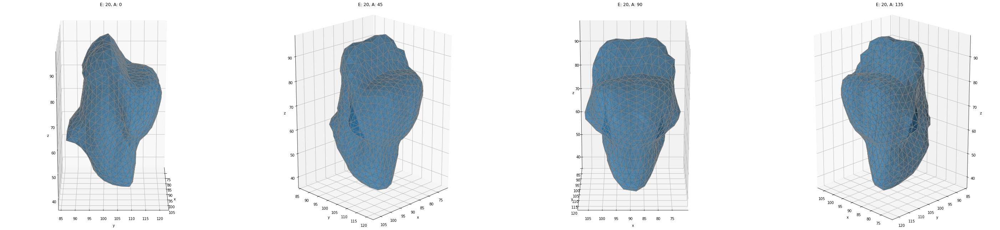

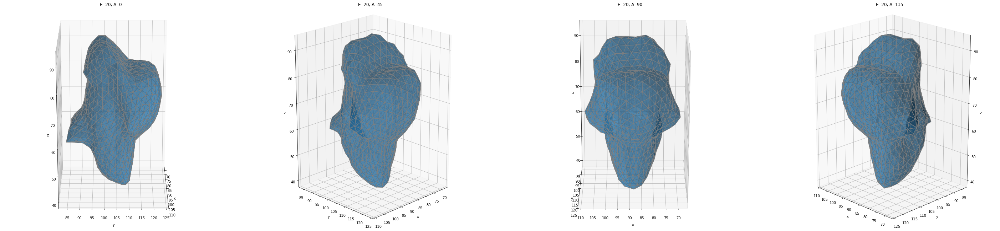

In [355]:
# Alignment 1
plot_mesh(
    meshes_deformed[4],
    faces,
    figsize=(50, 50),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    alpha=0.5,
)

# Alignment 2
plot_mesh(
    meshes_deformed[5],
    faces,
    figsize=(50, 50),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    alpha=0.5,
)